# Import Modules 

In [2]:
import glob as glob
import numpy as np
import matplotlib.pyplot as plt
import matplotlib as mpl
import matplotlib.patches as patches
import sys
from matplotlib import cm
from matplotlib import gridspec

from ipywidgets import interact, interactive, fixed, interact_manual
import ipywidgets as widgets
from tqdm.auto import tqdm, trange
from IPython.display import display
from IPython.display import HTML
from IPython import display

#matplotlib options
plt.rcParams['font.family']         = 'Times New Roman'
#plt.rcParams['font.serif']          = 'Times'
plt.rcParams['xtick.labelsize']     = 15
plt.rcParams['ytick.labelsize']     = 15
plt.rcParams['axes.linewidth']      = 2
plt.rcParams["xtick.minor.visible"] =  False
plt.rcParams["xtick.major.size"]    =  10
plt.rcParams["xtick.minor.size"]    =  5
plt.rcParams["xtick.major.width"]   =  2
plt.rcParams["xtick.minor.width"]   =  2
plt.rcParams["xtick.direction"]     =  'in'
plt.rcParams["ytick.minor.visible"] =  False
plt.rcParams["ytick.major.size"]    =  10
plt.rcParams["ytick.minor.size"]    =  5
plt.rcParams["ytick.major.width"]   =  2
plt.rcParams["ytick.minor.width"]   =  2
plt.rcParams["ytick.direction"]     =  'in'
plt.rcParams['text.usetex']         = True
plt.rcParams['legend.frameon']      = False

sys.path.append('/mnt/d/OneDrive - Universidad Autonoma de San Luis Potosi - UASLP/Documentos/LAB-CODES')
from Binning_Class import Binning, Image_Binning
import SPECTRA_ANALYSIS as spa
from BINNING_ANALYSIS import mapcell, map_video
import WinspecUtils


#  Select Experiment

In [3]:
PATH = "/mnt/d/OneDrive - Universidad Autonoma de San Luis Potosi - UASLP/Documentos/RUCO/EXPERIMENTOS/InP/2020-08-05-uRD/"
FL = glob.glob(PATH+'*')

def FD(FILES):
    LFILES = []
    for i in FILES:
        LFILES.append(i.split('/')[-1])
    return LFILES
    
def ShowFD(FILES):
    return FD(FILES)
 
SFL1 = widgets.Dropdown(
    options= FD(FL),
    value=FD(FL)[0],
    description='File:',
    disabled=False,
)
SFL2 = widgets.Dropdown(
    options= FD(FL),
    value=FD(FL)[0],
    description='File:',
    disabled=False,
)
    
    
#FL = interact(ShowFD,FILES=FD(FL));
#s.join(FL.value)

def option(Selection):
    if Selection == "R Pem-on":
        value= "on"
    elif Selection == "DR/R":
        value="div"
    elif Selection == "R Pem-off":
        value = "off"
    return value
# sel=interact(option,Selection=["R-on","DR/R","R-off"])

Exp1 = widgets.Dropdown(
    options= ["R Pem-on","DR/R","R Pem-off"],
    value='DR/R',
    description='Experiment:',
    disabled=False,
)

Exp2 = widgets.Dropdown(
    options= ["R Pem-on","DR/R","R Pem-off"],
    value='DR/R',
    description='Experiment:',
    disabled=False,
)


# Experiments

In [4]:
f = open("/mnt/d/OneDrive - Universidad Autonoma de San Luis Potosi - UASLP/Documentos/RUCO/EXPERIMENTOS/InP/2020-08-05-uRD/Bitacora_2020-08-05.txt","r")
print(f.read())

Muestra : InP
NOTAs:-
     
 
Parametros Del Sistema  :    
Temperatura General     : 300K
Voltaje Lampara         : 24 V
Potencia Lampara        : 70W
Temperatura CCD         : -35C

Parametros de Medicion 

 Muestra  Exp  Pos  Nombre  T[k]   Rango   Paso  Acumulacion  Time [s]  Slits  Laser P[mW]
   InP    RD    1   Exp001  300   600-900    1        10       0.1      250um    ON   1.5(error en medicion)
   InP    RD    1   Exp002  300   600-900    1        10       0.1      250um   OFF   1.5
   InP    RD    1   Exp003  300   600-900    1        15       0.3      250um   OFF   0.0
  
  



# DR at 300K with Laser

In [5]:
exp002R=widgets.HBox([SFL1, Exp1])
exp002R


# DR at 300k without Laser

In [6]:
exp003R =widgets.HBox([SFL2, Exp2])
exp003R



# Exp001 RD 30k Analisis
## Draw Area 1 to Binnging

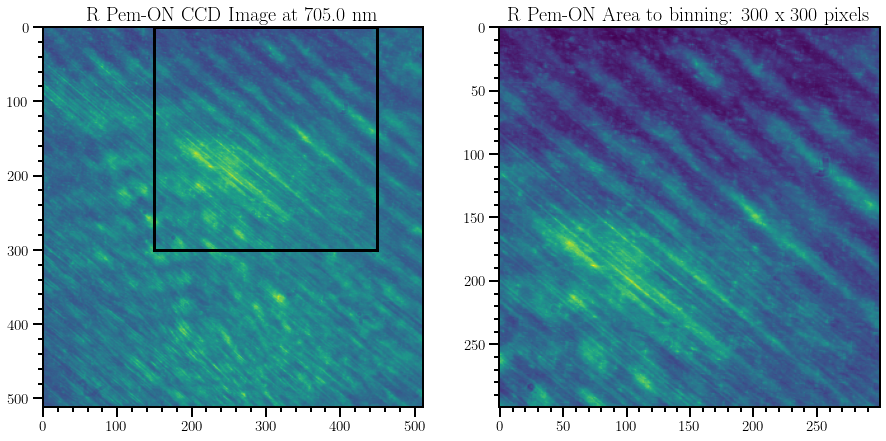

300
300


In [7]:
selR = option(exp002R.children[-1].value)
ExpNameR = exp002R.children[-1].value+ " Laser ON"
ExperimentR = exp002R.children[-1].value


#Draw Area
xi = 150; xf = 300
yi = 0 ; yf =300
binsize = 1

# Experimental paramters
li = 600 #initial Wavelength
lf = 900
wli = 705
# image with specific Wavlength
step = 1

ExpPath  = SFL1.value



#analisis_R = Image_Binning(path01,ExpName+"on",binsize,xi,xf,yi,yf,wli,li,lf,step)
analisisR = Image_Binning(PATH+ExpPath+'/',ExpPath+'on','on',binsize,xi,xf,yi,yf,wli,li,lf,step)

analisisR.draw_area()

imR = analisisR.image0out


n = analisisR.nb
m = analisisR.mb
print(n)
print(m)

# Exp003 DR 300k without Laser
## Draw Area 1 to Binnging

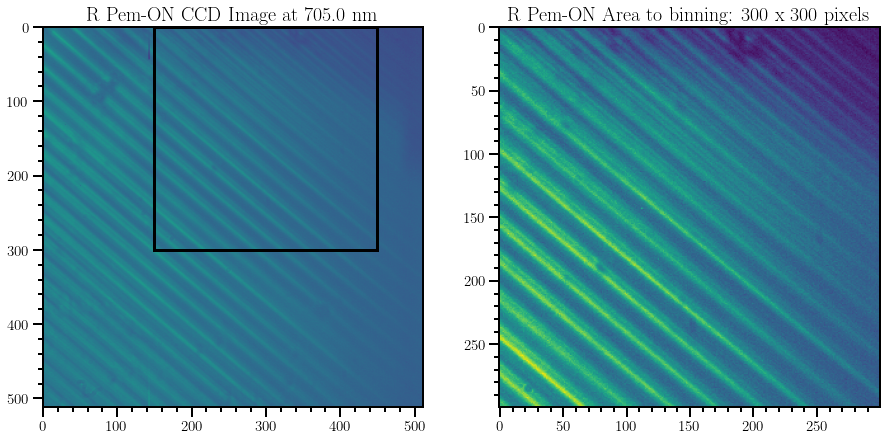

In [8]:
selR2 = option(exp003R.children[-1].value)
ExpNameR2 = exp003R.children[-1].value + " Laser OFF"
ExperimentR2 = exp003R.children[-1].value

ExpPath2  = SFL2.value

analisisR2 = Image_Binning(PATH+ExpPath2+'/',ExpPath2+'on','on',binsize,xi,xf,yi,yf,wli,li,lf,step)

analisisR2.draw_area()




## Binning Process

In [9]:
%%time
bina1 =analisisR.execute(selection="Array2CellB")
imagebina1 = bina1['Image']
cellbina1  = bina1['cell']

bina2 =analisisR2.execute(selection="Array2CellB")
imagebina2 = bina2['Image']
cellbina2  = bina2['cell']


CPU times: user 20.2 s, sys: 9.97 s, total: 30.1 s
Wall time: 39.3 s


# Show Result

## R at 300k with Laser 

In [13]:
xx = widgets.IntSlider(min = 0, max=m-1, step=1,layout={'width': '500px'}, continuous_update=False)
yy = widgets.IntSlider(min = 0, max=n-1, step=1,layout={'width': '500px'}, continuous_update=False)
xpeak = widgets.IntSlider(min = li, max=lf, step=step, continuous_update=False)
yminof = widgets.IntSlider(min = round(np.min(imagebina1),-3)-25000, max=round(np.min(imagebina1),-3)+25000,  value=round(np.min(imagebina1),-3),step=500,continuous_update=False)
ymaxof = widgets.IntSlider(min = round(np.max(imagebina1),-3)-30000, max=round(np.max(imagebina1),-3), value=round(np.max(imagebina1),-3),step=500,continuous_update=False)


labels = {'Experiment':ExpNameR2,
          'binning':binsize,
          'waveselect':wli,
          'exptype':selR2,
          'li':li,
          'lf':lf,
          'fsTitles':18,
           'fsTicks':15}

def update(xpix=0,ypix=0,peak=li,yoff1=0,yoff2=0):
    mapcell(imagebina1,cellbina1,xpix,ypix,peak,yoff1,yoff2,**labels)
 
    
interactive(update,xpix=xx,ypix=yy,peak=xpeak,yoff1=yminof,yoff2=ymaxof)


interactive(children=(IntSlider(value=0, continuous_update=False, description='xpix', layout=Layout(width='500…

## R at 300k without Laser 

In [14]:
yminof2 = widgets.IntSlider(min = round(np.min(imagebina2),-3)-3000, max=round(np.min(imagebina2),-3)+3000,  value=round(np.min(imagebina2),-3),step=100,continuous_update=False)
ymaxof2 = widgets.IntSlider(min = round(np.max(imagebina2),-3)-3000, max=round(np.max(imagebina2),-3)+3000, value=round(np.max(imagebina2),-3),step=100,continuous_update=False)


labelsr = {'Experiment':ExpNameR2,
           'binning':binsize,
           'waveselect':wli,
           'exptype':selR2,
           'li':li,
           'lf':lf,
            'fsTitles':18,
           'fsTicks':15
          }

def update2(xpix=0,ypix=0,peak=li,yoff1=0,yoff2=0):
    mapcell(imagebina2,cellbina2,xpix,ypix,peak,yoff1,yoff2,**labelsr)    
    
interactive(update2,xpix=xx,ypix=yy,peak=xpeak,yoff1=yminof2,yoff2=ymaxof2)

interactive(children=(IntSlider(value=64, continuous_update=False, description='xpix', layout=Layout(width='50…

# Create Map Video


# Map Area 1

CPU times: user 359 ms, sys: 172 ms, total: 531 ms
Wall time: 276 ms


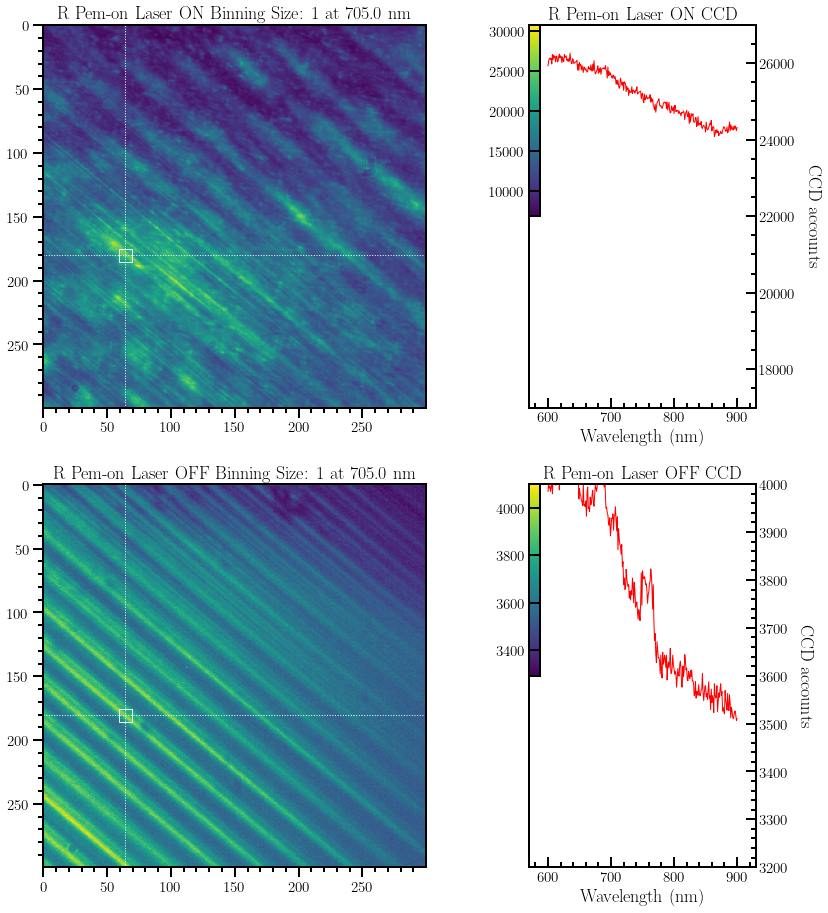

In [27]:
%%time

from mpl_toolkits.axes_grid1.inset_locator import inset_axes
from mpl_toolkits.axes_grid1 import make_axes_locatable
from mpl_toolkits.axes_grid1.inset_locator import inset_axes

fig2  = plt.figure(figsize=(13,13))
spec2 = gridspec.GridSpec(ncols=2,nrows=2, width_ratios=[2,1], left=0.1, bottom=0.05,top=0.95)
ax01  = fig2.add_subplot(spec2[0,0])
ax02  = fig2.add_subplot(spec2[0,1])
ax03  = fig2.add_subplot(spec2[1,0])
ax04  = fig2.add_subplot(spec2[1,1])


#ax03  = fig2.add_subplot(spec2[2])


ymax=ymaxof.value
ymin=yminof.value
ymax2=ymaxof2.value
ymin2=yminof2.value


#line1
x1 = 64
y1 = 180
#line2
# x2 = 100
# y2 = 10

#range
xi = 0
xf = 10

labels = {'Experiment':ExpNameR,
          'binning':binsize,
          'waveselect':wli,
          'exptype':selR,
          'li':li,
          'lf':lf,
          'fsTitles':18,
           'fsTicks':18}

labelsr = {'Experiment':ExpNameR2,
           'binning':binsize,
           'waveselect':wli,
           'exptype':selR2,
           'li':li,
           'lf':lf,
           'fsTitles':18,
           'fsTicks':18
          }

def add_line(ax1,ax2,cellb,xp,yp,ix,iy,xt,yt,cl='b'):
    ax1.plot([xp+ix],[yp+iy],marker = 's',color='w',markersize='13',markerfacecolor='none')
    ax1.axhline([yp+iy], ls = ':',color='w', lw=1)
    ax1.axvline([xp+ix], ls = ':',color='w', lw=1)
    ax1.plot([xp,xp+ix],[yp,yp+iy],cl,lw=3)
    #ax1.text(xt,yt,      'x Pixel:%d'%(xp+ix),color=cl,fontsize=13,transform=ax1.transAxes)
    #ax1.text(xt,yt-0.04, 'y Pixel:%d'%(yp+iy),color=cl,fontsize=13,transform=ax1.transAxes)
    ax2.plot(cellb[xp+ix,yp+iy][:,0],cellb[xp+ix,yp+iy][:,1],cl,lw=1)


def add_plots(ax1,ax2,image,yoff1,yoff2,**labels):
    ax1.clear()
    im2 = ax1.imshow(image,cmap=cm.viridis)
    ax1.tick_params(direction='out',which='both')
    ax1.minorticks_on()
    ax1.set_title("%s Binning Size: %s at %.1f nm"%(labels['Experiment'],labels['binning'],labels['waveselect']), fontsize=labels['fsTitles'])
    
    ax2.clear()   
    ax2.set_title("%s CCD " %(labels['Experiment']), fontsize=labels['fsTitles']),
    ax2.set_xlabel('Wavelength (nm)',fontsize = labels['fsTicks'])
    ax2.set_ylabel('CCD accounts ',fontsize = labels['fsTicks'],rotation=-90, labelpad=25)
    ax2.set_ylim([yoff1,yoff2])
    ax2.minorticks_on()
    ax2.yaxis.tick_right()
    ax2.yaxis.set_label_position("right")
    ax2.set_xlim([labels['li']-30,labels['lf']+30])
    axins = inset_axes(ax2,
                    width="5%",  # width = 50% of parent_bbox width
                    height="50%",  # height : 5%
                    loc="upper left",
                    borderpad=0)
    plt.colorbar(im2, cax=axins, orientation="vertical")
    axins.yaxis.tick_left()
    


#initialice plots
for i in range(xi,xf,10):
    #ON
    map_video(cellbina1,imagebina1,ax01,ax02,x1,y1-i,x1,y1,ymin,ymax,selR,**labels) 
    #add_line(ax01,ax02,cellbina1,x2,y2,i,i,0.6,0.89)
    #OFF
    add_plots(ax03,ax04,imagebina2,ymin2,ymax2,**labelsr)
    add_line(ax03,ax04,cellbina2,x1,y1,0,-i,0.8,0.2,cl='r')
    #add_line(ax03,ax04,cellbina2,x2,y2,i,i,0.8,0.12)


    
    


    

In [28]:
%%time
%%capture
%matplotlib inline
import matplotlib.animation as animation
from matplotlib.animation import PillowWriter
from mpl_toolkits.axes_grid1 import make_axes_locatable
import matplotlib.animation


#from IPython.display import HTML
plt.rcParams["animation.html"] = "jshtml"
plt.rcParams['figure.facecolor'] = 'w'
matplotlib.rcParams['animation.embed_limit'] = 2**128



fig3  = plt.figure(figsize=(13,13))
spec2 = gridspec.GridSpec(ncols=2,nrows=2, width_ratios=[1.5,1], left=0.1, bottom=0.05,top=0.95)
ax1  = fig3.add_subplot(spec2[0,0])
ax2  = fig3.add_subplot(spec2[0,1])
ax3  = fig3.add_subplot(spec2[1,0])
ax4  = fig3.add_subplot(spec2[1,1])


# ymax=ymaxof.value
# ymin=yminof.value
# Function to evaluate frames


frame_step =1

def video(i):
    return [map_video(cellbina1,imagebina1,ax1,ax2,x1,y1-i,x1,y1,ymin,ymax,selR,**labels),
            #add_line(ax1,ax2,cellbina1,x2,y2,i,i,0.6,0.88),
            add_plots(ax3,ax4,imagebina2,ymin2,ymax2,**labelsr),
            add_line(ax3,ax4,cellbina2,x1,y1,0,-i,0.6,0.97,cl='r'),
            #add_line(ax3,ax4,cellbina2,x2,y2,i,i,0.6,0.88)
           ]


animation = matplotlib.animation.FuncAnimation(fig3,video, frames=np.arange(xi,xf,frame_step));

animation

CPU times: user 20.2 s, sys: 2.56 s, total: 22.8 s
Wall time: 18.5 s


In [29]:
animation